<a href="https://colab.research.google.com/github/UsmanGhias/calculatorUsmanJava/blob/main/Final_Year_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install rasterio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 35.1 MB/s eta 0:00:00


In [ ]:
sentinel_image = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'


Read the images using rasterio as well as cv2


In [ ]:
#All Imports

import rasterio
import cv2
import matplotlib.pyplot as plt
import numpy as np


Image Shape: (13, 2797, 3909)
Number of Bands: 13
Resolution: (8.983152841195215e-05, 8.983152841195215e-05)
Coordinate Reference System (CRS): EPSG:4326


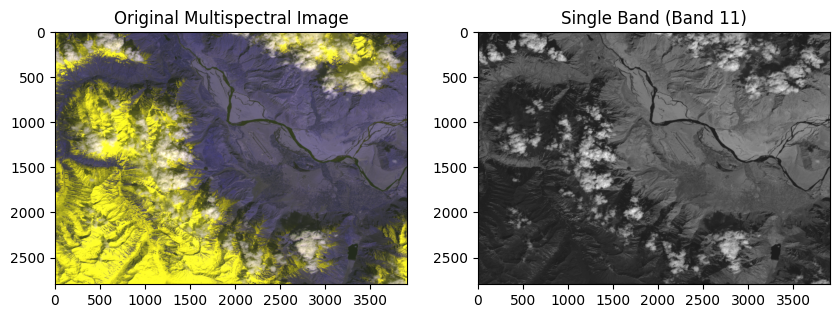

In [ ]:

def read_image(image_path):
    try:
        # Open the multispectral image
        src = rasterio.open(image_path)

        # Read the multispectral bands
        bands = src.read()

        # Display metadata information
        print(f"Image Shape: {bands.shape}")
        print(f"Number of Bands: {src.count}")
        print(f"Resolution: {src.res}")
        print(f"Coordinate Reference System (CRS): {src.crs}")

        # Choose specific bands for RGB visualization
        rgb_bands = bands[[3, 2, 11], :, :]

        # Normalize the data for displaying RGB image
        rgb_image = (rgb_bands.clip(0, 10000) / 10000).transpose(1, 2, 0)

        # Display the original multispectral image
        fig, ax = plt.subplots(1, 2, figsize=(10, 5))
        ax[0].imshow(rgb_image)
        ax[0].set_title('Original Multispectral Image')

        # Save the RGB image
        cv2.imwrite('rgb_image.png', (rgb_image * 255).astype(np.uint8))

        # Display a single-band image as a sample
        ax[1].imshow(bands[11], cmap='gray')  # Display the first band as a sample
        ax[1].set_title('Single Band (Band 11)')

        plt.show()

    except Exception as e:
        print(f"Error: {e}")

    finally:
        # Close the rasterio dataset
        if src:
            src.close()

# Specify the image path for the 13-band image
image_path_13bands = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Read and visualize the 13-band image
read_image(image_path_13bands)


Image Shape: (13, 2797, 3909)
Number of Bands: 13
Resolution: (8.983152841195215e-05, 8.983152841195215e-05)
Coordinate Reference System (CRS): EPSG:4326


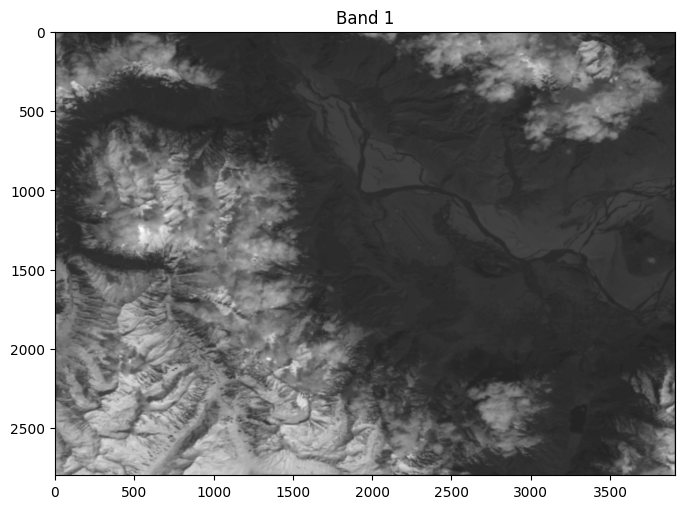

Band 1 Characteristics:
Min Value: 0
Max Value: 15396
Mean Value: 4924.121706981853
Standard Deviation: 2604.3464278181614



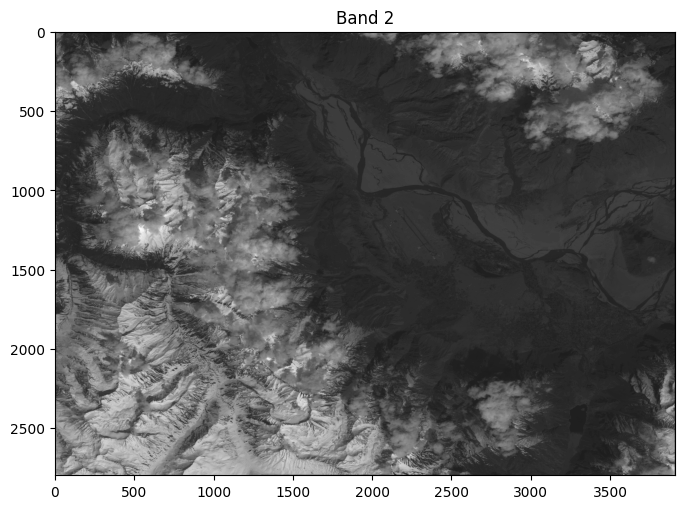

Band 2 Characteristics:
Min Value: 0
Max Value: 16240
Mean Value: 4831.761101253005
Standard Deviation: 2734.328786803722



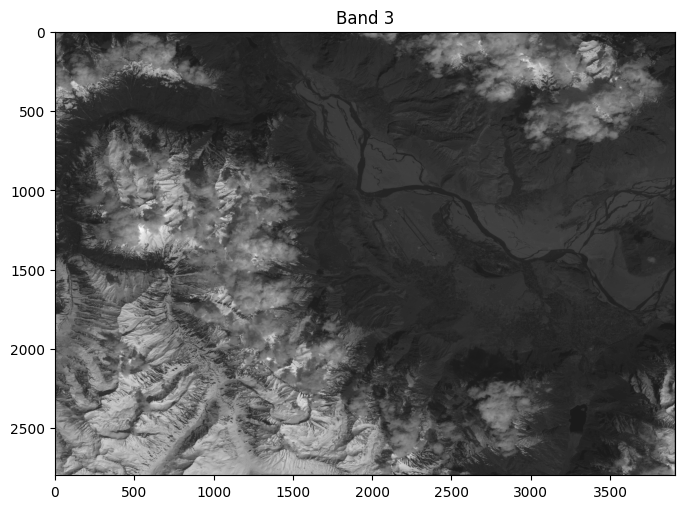

Band 3 Characteristics:
Min Value: 0
Max Value: 16092
Mean Value: 4690.507962474504
Standard Deviation: 2645.386154193158



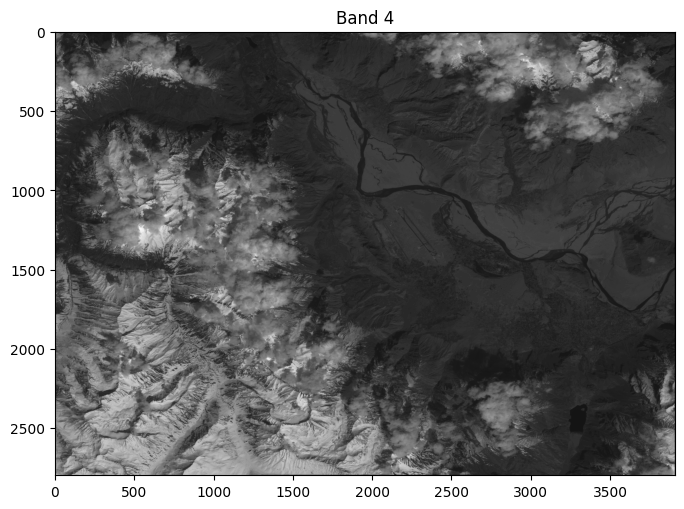

Band 4 Characteristics:
Min Value: 0
Max Value: 17028
Mean Value: 4838.508956028885
Standard Deviation: 2755.4713304490247



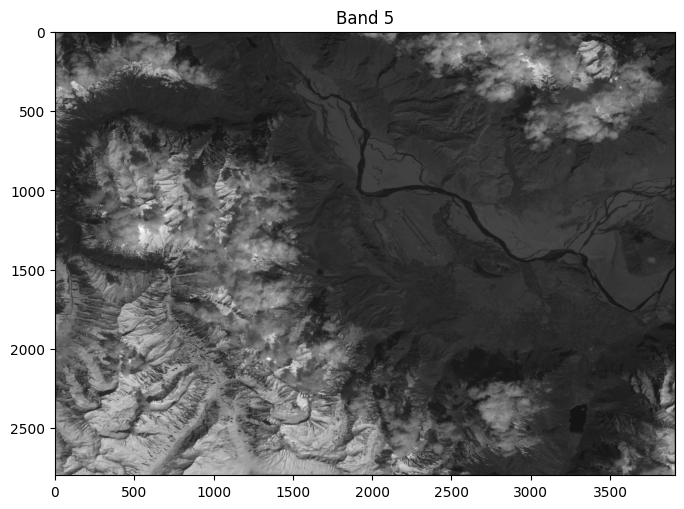

Band 5 Characteristics:
Min Value: 0
Max Value: 16749
Mean Value: 4892.394165513557
Standard Deviation: 2743.6284846299004



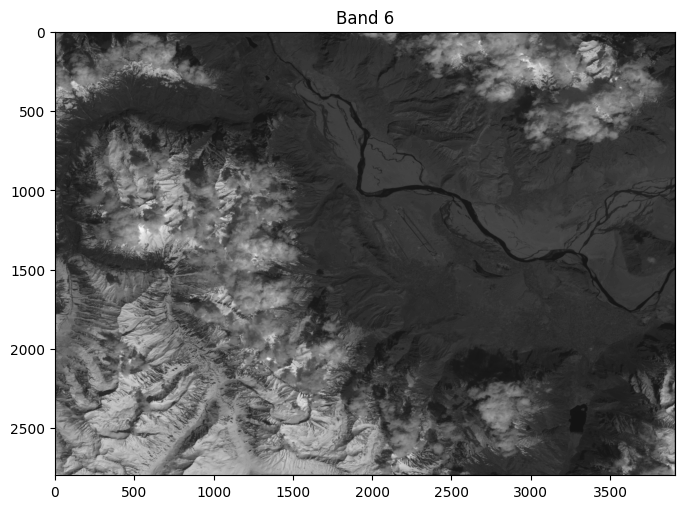

Band 6 Characteristics:
Min Value: 0
Max Value: 16547
Mean Value: 4914.340351963187
Standard Deviation: 2676.628431695494



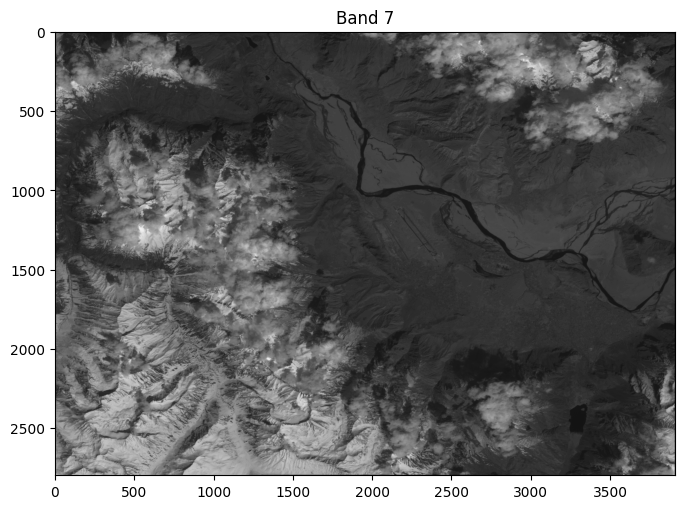

Band 7 Characteristics:
Min Value: 0
Max Value: 16394
Mean Value: 4899.1396047715125
Standard Deviation: 2567.1374272604394



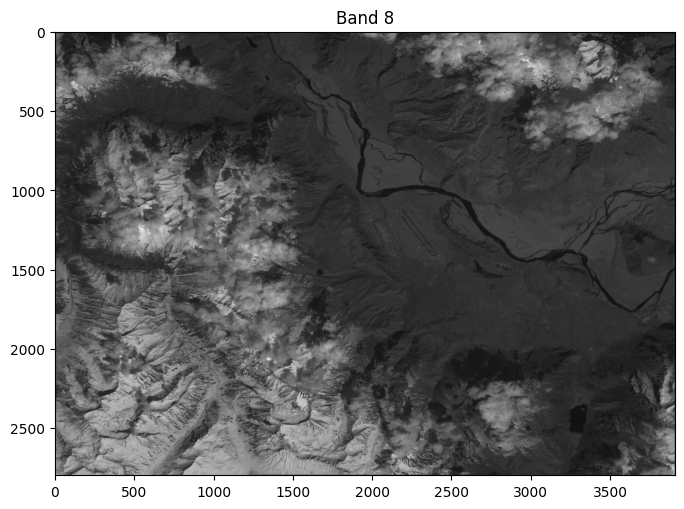

Band 8 Characteristics:
Min Value: 0
Max Value: 16937
Mean Value: 4789.001533364559
Standard Deviation: 2516.1615838855555



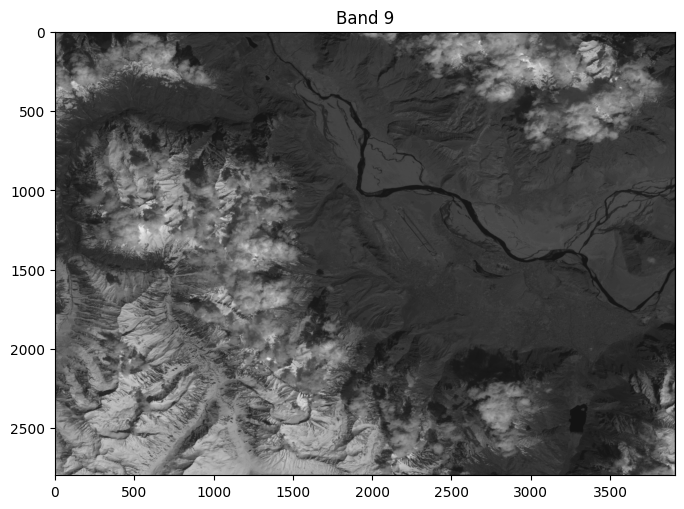

Band 9 Characteristics:
Min Value: 0
Max Value: 16011
Mean Value: 4841.750425962547
Standard Deviation: 2460.352918812302



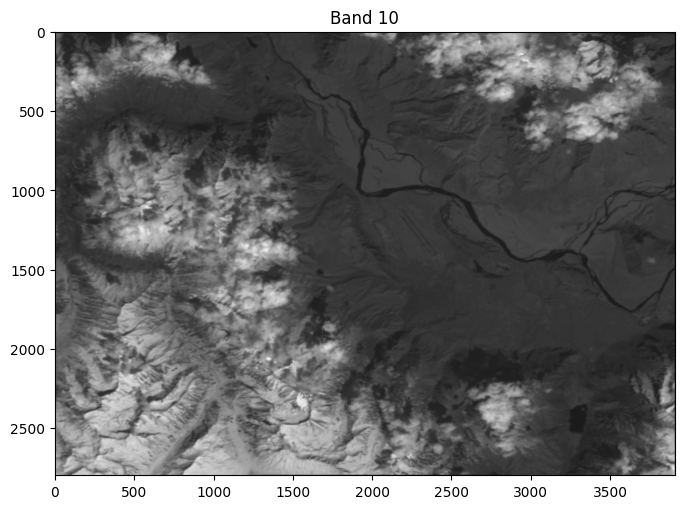

Band 10 Characteristics:
Min Value: 0
Max Value: 10424
Mean Value: 3391.9042399427885
Standard Deviation: 1733.0448510872545



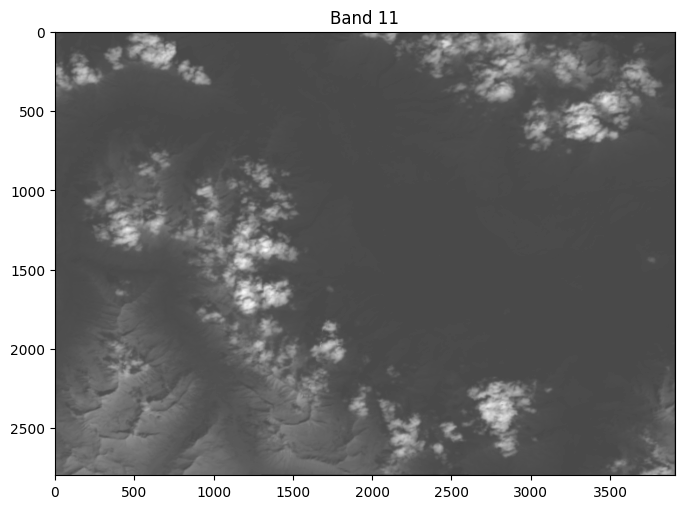

Band 11 Characteristics:
Min Value: 0
Max Value: 3553
Mean Value: 1218.8865138277654
Standard Deviation: 317.9098623701584



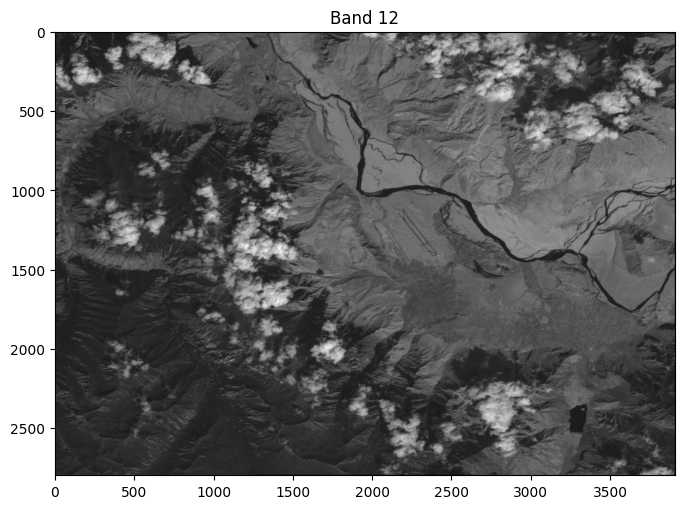

Band 12 Characteristics:
Min Value: 0
Max Value: 10032
Mean Value: 3061.1850656237043
Standard Deviation: 1420.8185068177193



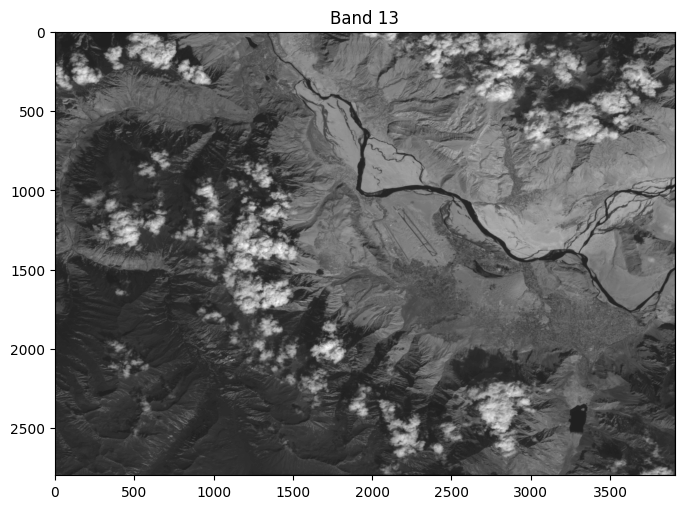

Band 13 Characteristics:
Min Value: 0
Max Value: 8382
Mean Value: 2877.210386763657
Standard Deviation: 1311.965149582432



In [ ]:
def visualize_band(band_data, band_index):
    plt.figure(figsize=(8, 8))
    plt.imshow(band_data, cmap='gray')
    plt.title(f'Band {band_index + 1}')
    plt.show()

def analyze_band_characteristics(band_data, band_index):
    print(f"Band {band_index + 1} Characteristics:")
    print(f"Min Value: {np.min(band_data)}")
    print(f"Max Value: {np.max(band_data)}")
    print(f"Mean Value: {np.mean(band_data)}")
    print(f"Standard Deviation: {np.std(band_data)}")
    print()

def create_and_visualize_individual_bands(image_path):
    try:
        # Open the multispectral image
        src = rasterio.open(image_path)

        # Read the multispectral bands
        bands = src.read()

        # Display metadata information
        print(f"Image Shape: {bands.shape}")
        print(f"Number of Bands: {src.count}")
        print(f"Resolution: {src.res}")
        print(f"Coordinate Reference System (CRS): {src.crs}")

        # Loop through each band
        for i in range(src.count):
            band_data = bands[i, :, :]
            visualize_band(band_data, i)
            analyze_band_characteristics(band_data, i)

    except Exception as e:
        print(f"Error: {e}")

    finally:
        # Close the rasterio dataset
        if src:
            src.close()

# Specify the image path for the 13-band image
image_path_13bands = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Create and visualize individual bands
create_and_visualize_individual_bands(image_path_13bands)


NIR Bands:

Bands that capture near-infrared (NIR) information are often useful for vegetation health and land cover classification. These bands can help distinguish between different types of surfaces.
Considering your band characteristics, Bands 8 and 5 seem to have relatively high mean values, which may indicate higher reflectance.
Red Bands:

Red bands are also important for vegetation analysis and can be used in conjunction with NIR bands to calculate vegetation indices like NDVI.
Band 4 seems to have a relatively high mean value.
Shortwave Infrared (SWIR) Bands:

SWIR bands can provide valuable information about surface composition and moisture content.
Bands 11 and 12 seem to have relatively high mean values.
Given these considerations, you might consider using a combination of bands such as 4 (Red), 5 (NIR), 8 (NIR), 11 (SWIR), and 12 (SWIR) for your deep learning framework.

<ipython-input-7-4feb07c50da5>:14: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir_band - red_band) / (nir_band + red_band)


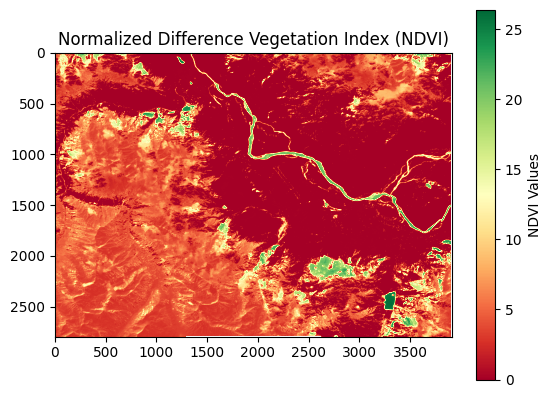

In [ ]:
def read_image_and_calculate_ndvi(image_path, red_band_index, nir_band_index):
    try:
        # Open the multispectral image
        src = rasterio.open(image_path)

        # Read the multispectral bands
        bands = src.read()

        # Choose the red and NIR bands
        red_band = bands[red_band_index, :, :]
        nir_band = bands[nir_band_index, :, :]

        # Calculate NDVI
        ndvi = (nir_band - red_band) / (nir_band + red_band)

        # Display the NDVI image
        plt.imshow(ndvi, cmap='RdYlGn')
        plt.title('Normalized Difference Vegetation Index (NDVI)')
        plt.colorbar(label='NDVI Values')
        plt.show()

    except Exception as e:
        print(f"Error: {e}")

    finally:
        # Close the rasterio dataset
        if src:
            src.close()

# Specify the image path for the 13-band image
image_path_13bands = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Specify the bands for NDVI calculation based on your chosen bands
red_band_index_13bands = 4  # Replace with the actual index of the red band
nir_band_index_13bands = 8  # Replace with the actual index of the NIR band


# Read the 13-band image and calculate NDVI
read_image_and_calculate_ndvi(image_path_13bands, red_band_index_13bands, nir_band_index_13bands)


#Below this error for the 13 band image is resolved

<ipython-input-8-6685e37b7b5c>:15: RuntimeWarning: invalid value encountered in divide
  ndvi = np.where(denominator != 0, (nir_band - red_band) / denominator, 0)


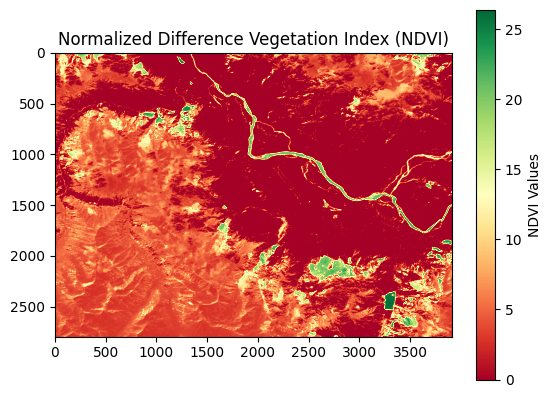

In [ ]:
def read_image_and_calculate_ndvi(image_path, red_band_index, nir_band_index):
    try:
        # Open the multispectral image
        src = rasterio.open(image_path)

        # Read the multispectral bands
        bands = src.read()

        # Choose the red and NIR bands
        red_band = bands[red_band_index, :, :]
        nir_band = bands[nir_band_index, :, :]

        # Calculate NDVI with a check for division by zero
        denominator = nir_band + red_band
        ndvi = np.where(denominator != 0, (nir_band - red_band) / denominator, 0)

        # Display the NDVI image
        plt.imshow(ndvi, cmap='RdYlGn')
        plt.title('Normalized Difference Vegetation Index (NDVI)')
        plt.colorbar(label='NDVI Values')
        plt.show()

    except Exception as e:
        print(f"Error: {e}")

    finally:
        # Close the rasterio dataset
        if src:
            src.close()

# Specify the image path for the 13-band image
image_path_13bands = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Specify the bands for NDVI calculation based on the chosen bands (replace with actual band indices)
red_band_index_13bands = 4  # Replace with the actual index of the red band
nir_band_index_13bands = 8  # Replace with the actual index of the NIR band

# Read the 13-band image and calculate NDVI
read_image_and_calculate_ndvi(image_path_13bands, red_band_index_13bands, nir_band_index_13bands)


Band 2 is Red and Band 8 as NIR Band

<ipython-input-9-162765376f90>:3: RuntimeWarning: invalid value encountered in divide
  ndwi = (green_band - nir_band) / (green_band + nir_band)


Image Shape: (13, 2797, 3909)
Resolution: (8.983152841195215e-05, 8.983152841195215e-05)
Coordinate Reference System (CRS): EPSG:4326


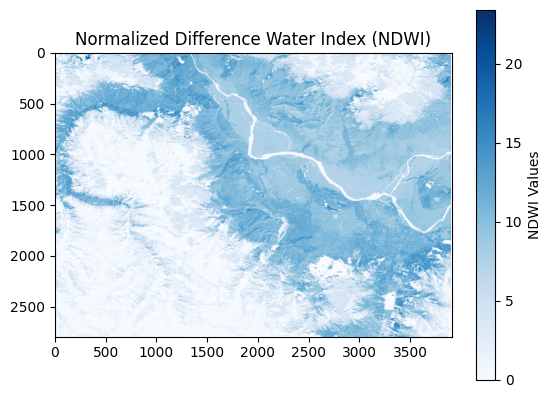

In [ ]:
# NDWI (Normalized Difference Water Index) Calculation
def calculate_ndwi(green_band, nir_band):
    ndwi = (green_band - nir_band) / (green_band + nir_band)
    return ndwi

try:
    # Open the multispectral image
    src = rasterio.open('/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif')

    # Read the multispectral bands
    bands = src.read()

    # Choose the green and NIR bands
    green_band_index = 3  # Replace with the actual index of the green band
    nir_band_index = 8    # Replace with the actual index of the NIR band

    green_band = bands[green_band_index]
    nir_band = bands[nir_band_index]

    # Calculate NDWI
    ndwi = calculate_ndwi(green_band, nir_band)

    # Display metadata information
    print(f"Image Shape: {bands.shape}")
    print(f"Resolution: {src.res}")
    print(f"Coordinate Reference System (CRS): {src.crs}")

    # Display the NDWI image
    plt.imshow(ndwi, cmap='Blues')
    plt.title('Normalized Difference Water Index (NDWI)')
    plt.colorbar(label='NDWI Values')
    plt.show()

except Exception as e:
    print(f"Error: {e}")

finally:
    # Close the rasterio dataset
    if src:
        src.close()


Image Shape: (6, 2797, 3909)
Resolution: (8.983152841195215e-05, 8.983152841195215e-05)
Coordinate Reference System (CRS): EPSG:4326


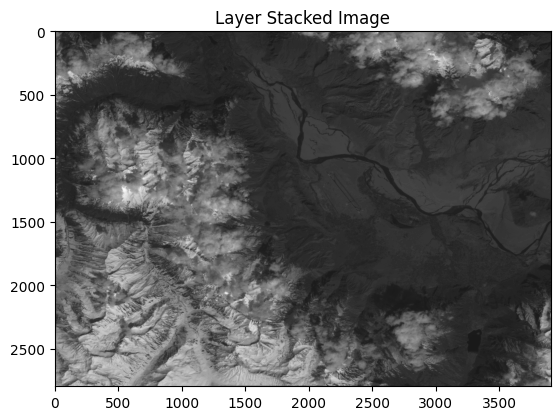

Stacked image saved at: /content/drive/MyDrive/SentinalTwoImage/stacked_image.png


In [ ]:
# Function to perform layer stacking
def stack_layers(image_path, selected_bands):
    try:
        # Open the multispectral image
        src = rasterio.open(image_path)

        # Read selected bands
        bands = src.read(selected_bands)

        # Display metadata information
        print(f"Image Shape: {bands.shape}")
        print(f"Resolution: {src.res}")
        print(f"Coordinate Reference System (CRS): {src.crs}")

        # Stack the bands into a single channel image
        stacked_image = np.mean(bands, axis=0)

        # Save the stacked image
        stacked_image_path = '/content/drive/MyDrive/SentinalTwoImage/stacked_image.png'
        plt.imsave(stacked_image_path, stacked_image, cmap='gray')

        # Display the stacked image
        plt.imshow(stacked_image, cmap='gray')
        plt.title('Layer Stacked Image')
        plt.show()

        return stacked_image_path

    except Exception as e:
        print(f"Error: {e}")

    finally:
        # Close the rasterio dataset
        if src:
            src.close()

# Specify the image path and bands to stack
selected_bands = [1, 2, 3, 4, 5, 6]  # Replace with the indices of bands to stack
image_path = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Perform layer stacking
stacked_image_path = stack_layers(image_path, selected_bands)

# Display the saved image path
print(f'Stacked image saved at: {stacked_image_path}')


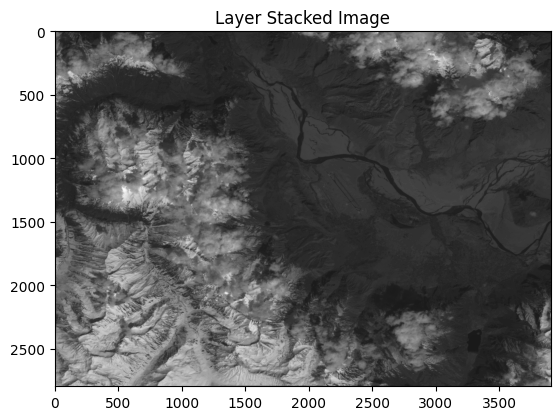

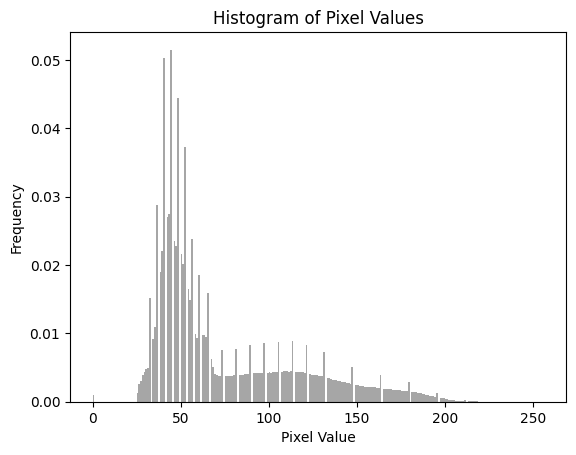

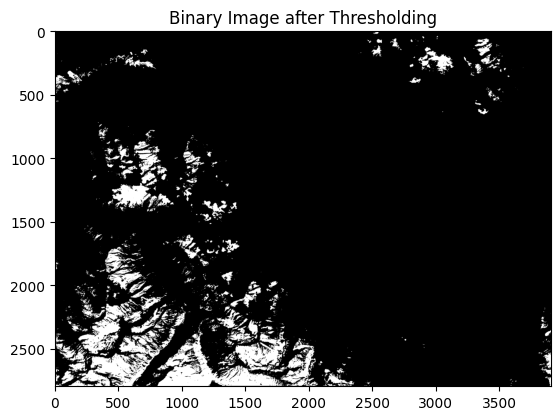

In [ ]:
# Load the stacked image
stacked_image_path = "/content/drive/MyDrive/SentinalTwoImage/stacked_image.png"
stacked_image = cv2.imread(stacked_image_path, cv2.IMREAD_GRAYSCALE)

# Display the stacked image
plt.imshow(stacked_image, cmap='gray')
plt.title('Layer Stacked Image')
plt.show()

# Flatten the image to a 1D array
pixel_values = stacked_image.flatten()

# Plot the histogram
plt.hist(pixel_values, bins=256, range=[0, 256], density=True, color='gray', alpha=0.7)
plt.title('Histogram of Pixel Values')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.show()

# Apply pattern recognition based on histogram analysis
# You can define thresholds or patterns based on the histogram information
# For example, identifying peaks or specific ranges of pixel values

# Example: Thresholding based on a specific value (adjust as needed)
threshold_value = 150
binary_image = (stacked_image > threshold_value).astype(np.uint8) * 255

# Display the binary image
plt.imshow(binary_image, cmap='gray')
plt.title('Binary Image after Thresholding')
plt.show()


Image Shape: (13, 2797, 3909)
Resolution: (8.983152841195215e-05, 8.983152841195215e-05)
Coordinate Reference System (CRS): EPSG:4326


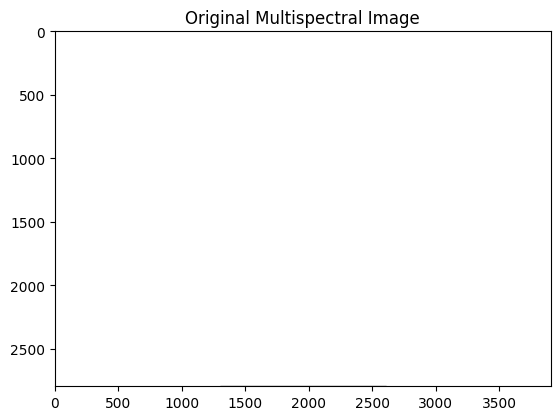

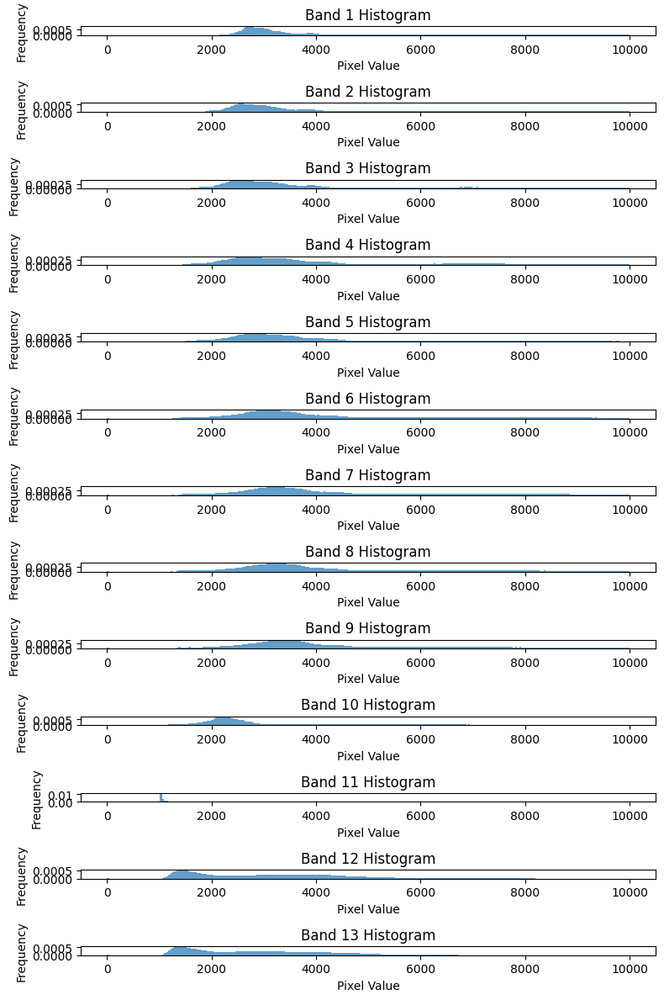

In [ ]:
# Specify the image path
image_path = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

try:
    # Open the multispectral image
    src = rasterio.open(image_path)

    # Read the multispectral bands
    bands = src.read()

    # Display metadata information
    print(f"Image Shape: {bands.shape}")
    print(f"Resolution: {src.res}")
    print(f"Coordinate Reference System (CRS): {src.crs}")

    # Display the original multispectral image
    plt.imshow(bands[:3, :, :].transpose(1, 2, 0))
    plt.title('Original Multispectral Image')
    plt.show()

    # Plot histograms for each band
    fig, axs = plt.subplots(bands.shape[0], 1, figsize=(8, 12))

    for i in range(bands.shape[0]):
        axs[i].hist(bands[i].flatten(), bins=256, range=[0, 10000], density=True, alpha=0.7)
        axs[i].set_title(f'Band {i+1} Histogram')
        axs[i].set_xlabel('Pixel Value')
        axs[i].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()

except Exception as e:
    print(f"Error: {e}")

finally:
    # Close the rasterio dataset
    if src:
        src.close()

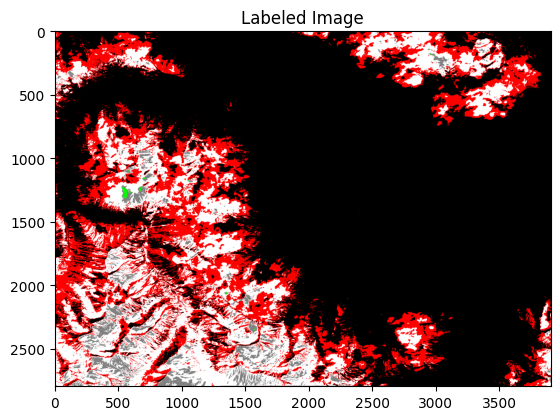

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the stacked image
stacked_image = cv2.imread('/content/drive/MyDrive/SentinalTwoImage/stacked_image.png', cv2.IMREAD_GRAYSCALE)

# Define pixel value ranges for each class
water_range = (80, 120)
snow_range = (120, 180)
cloud_range = (180, 220)
debris_range = (220, 255)

# Create masks for each class
water_mask = cv2.inRange(stacked_image, *water_range)
snow_mask = cv2.inRange(stacked_image, *snow_range)
cloud_mask = cv2.inRange(stacked_image, *cloud_range)
debris_mask = cv2.inRange(stacked_image, *debris_range)

# Create a labeled image with different colors for each class
labeled_image = np.zeros((stacked_image.shape[0], stacked_image.shape[1], 3), dtype=np.uint8)

# Assign colors based on masks
labeled_image[water_mask == 255] = [0, 0, 255]  # Blue for water
labeled_image[snow_mask == 255] = [255, 255, 255]  # White for snow
labeled_image[cloud_mask == 255] = [128, 128, 128]  # Gray for cloud
labeled_image[debris_mask == 255] = [0, 255, 0]  # Green for debris

# Display the labeled image
plt.imshow(cv2.cvtColor(labeled_image, cv2.COLOR_BGR2RGB))
plt.title('Labeled Image')
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


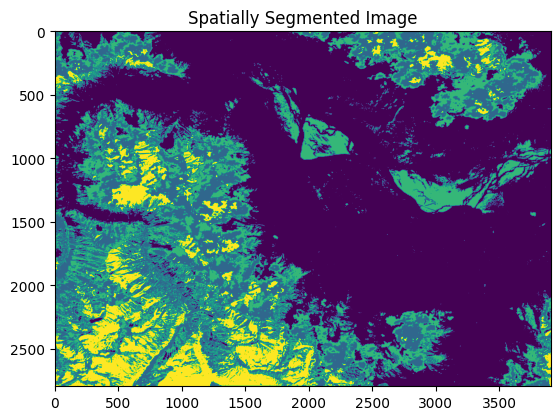

In [ ]:
from sklearn.cluster import KMeans

# Load the stacked image
stacked_image = cv2.imread('/content/drive/MyDrive/SentinalTwoImage/stacked_image.png', cv2.IMREAD_COLOR)

# Reshape the image to a 2D array of pixels
pixels = stacked_image.reshape((-1, 3))

# Apply K-Means clustering
kmeans = KMeans(n_clusters=4)  # Adjust the number of clusters based on your classes
kmeans.fit(pixels)

# Assign labels to each pixel
segmented_image = kmeans.labels_.reshape(stacked_image.shape[:2])

# Visualize the segmented image
plt.imshow(segmented_image, cmap='viridis')  # Adjust the colormap as needed
plt.title('Spatially Segmented Image')
plt.show()


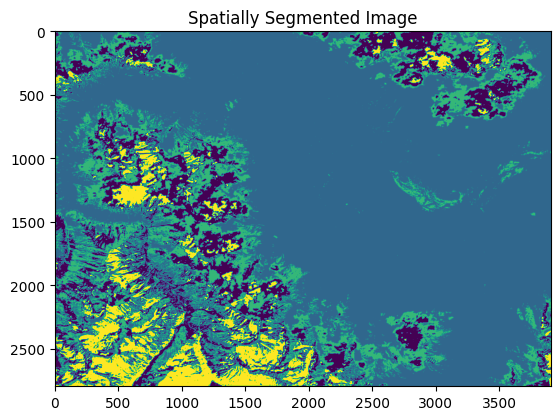

In [ ]:
# Load the stacked image
stacked_image = cv2.imread('/content/drive/MyDrive/SentinalTwoImage/stacked_image.png', cv2.IMREAD_COLOR)

# Reshape the image to a 2D array of pixels
pixels = stacked_image.reshape((-1, 3))

# Apply K-Means clustering with explicit n_init value
kmeans = KMeans(n_clusters=4, n_init=10)  # Adjust the number of clusters and n_init as needed
kmeans.fit(pixels)

# Assign labels to each pixel
segmented_image = kmeans.labels_.reshape(stacked_image.shape[:2])

# Visualize the segmented image
plt.imshow(segmented_image, cmap='viridis')  # Adjust the colormap as needed
plt.title('Spatially Segmented Image')
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


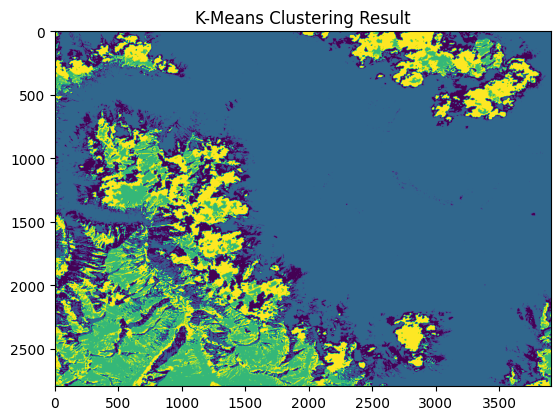

In [ ]:
import rasterio
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Open the multispectral image
image_path = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'
src = rasterio.open(image_path)

# Read the multispectral bands
bands = src.read()

# Reshape the data for clustering
reshaped_data = bands.transpose(1, 2, 0).reshape(-1, bands.shape[0])

# Perform k-means clustering
n_clusters = 4  # Adjust as needed
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
labels = kmeans.fit_predict(reshaped_data)

# Reshape the labels back to the original image shape
clustered_image = labels.reshape(bands.shape[1], bands.shape[2])

# Display the clustered image
plt.imshow(clustered_image, cmap='viridis')  # Adjust the cmap as needed
plt.title('K-Means Clustering Result')
plt.show()

# Close the rasterio dataset
src.close()


In [ ]:
# Define the path to your Sentinel-2 image
image_path = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Open the image using rasterio
with rasterio.open(image_path) as src:
    # Read the image data as a numpy array
    image_data = src.read()

# Check the shape of the array (should be (num_bands, height, width))
print("Shape of the image data array:", image_data.shape)

# Separate the bands
band_arrays = []
for band in range(image_data.shape[0]):
    band_arrays.append(image_data[band, :, :])

# Convert the list of arrays to numpy arrays
band_arrays = np.array(band_arrays)

# Check the shape of one of the band arrays
print("Shape of one band array:", band_arrays[0].shape)


Shape of the image data array: (13, 2797, 3909)
Shape of one band array: (2797, 3909)


In [ ]:
# Define the path to your Sentinel-2 image
image_path = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Open the image file using rasterio
with rasterio.open(image_path) as src:
    # Read the image data
    image_data = src.read()

# Display the total number of pixels in the image
total_pixels = np.prod(image_data.shape[1:])
print("Total number of pixels in the image:", total_pixels)

# Iterate through each band and display pixel values for specific points
points_to_display = [(1, 2), (3, 4), (1000, 2000)]  # Add more points as needed

for band_index in range(image_data.shape[0]):
    print(f"\nPixel values for band {band_index + 1}:")
    for point in points_to_display:
        pixel_value = image_data[band_index, point[0], point[1]]
        print(f"Band {band_index + 1} - Point {point}: {pixel_value}")


Total number of pixels in the image: 10933473

Pixel values for band 1:
Band 1 - Point (1, 2): 0
Band 1 - Point (3, 4): 5065
Band 1 - Point (1000, 2000): 3948

Pixel values for band 2:
Band 2 - Point (1, 2): 0
Band 2 - Point (3, 4): 3813
Band 2 - Point (1000, 2000): 3989

Pixel values for band 3:
Band 3 - Point (1, 2): 0
Band 3 - Point (3, 4): 3715
Band 3 - Point (1000, 2000): 4034

Pixel values for band 4:
Band 4 - Point (1, 2): 0
Band 4 - Point (3, 4): 3856
Band 4 - Point (1000, 2000): 4280

Pixel values for band 5:
Band 5 - Point (1, 2): 0
Band 5 - Point (3, 4): 4590
Band 5 - Point (1000, 2000): 4323

Pixel values for band 6:
Band 6 - Point (1, 2): 0
Band 6 - Point (3, 4): 4745
Band 6 - Point (1000, 2000): 4386

Pixel values for band 7:
Band 7 - Point (1, 2): 0
Band 7 - Point (3, 4): 4837
Band 7 - Point (1000, 2000): 4472

Pixel values for band 8:
Band 8 - Point (1, 2): 0
Band 8 - Point (3, 4): 4053
Band 8 - Point (1000, 2000): 4381

Pixel values for band 9:
Band 9 - Point (1, 2): 0

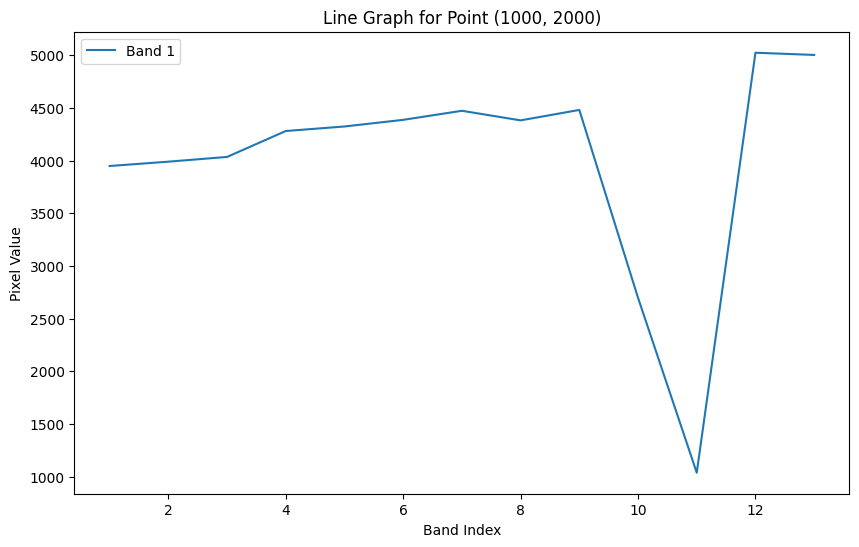

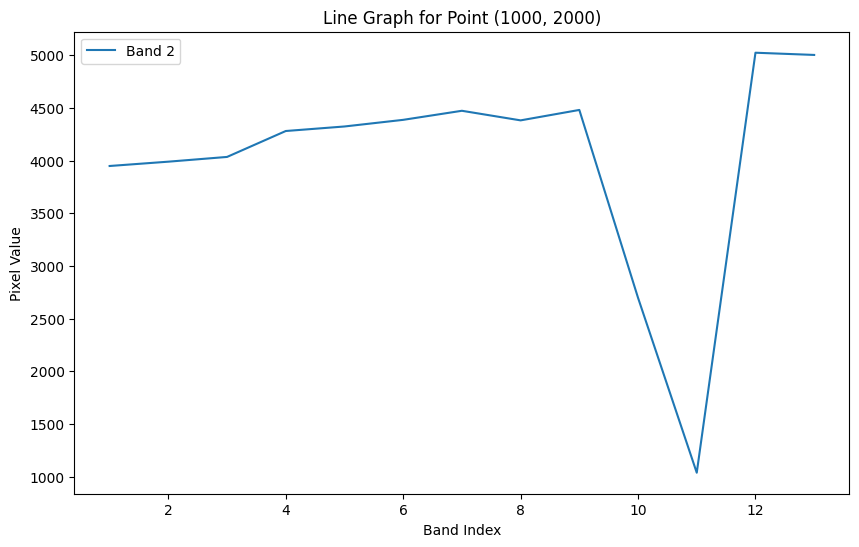

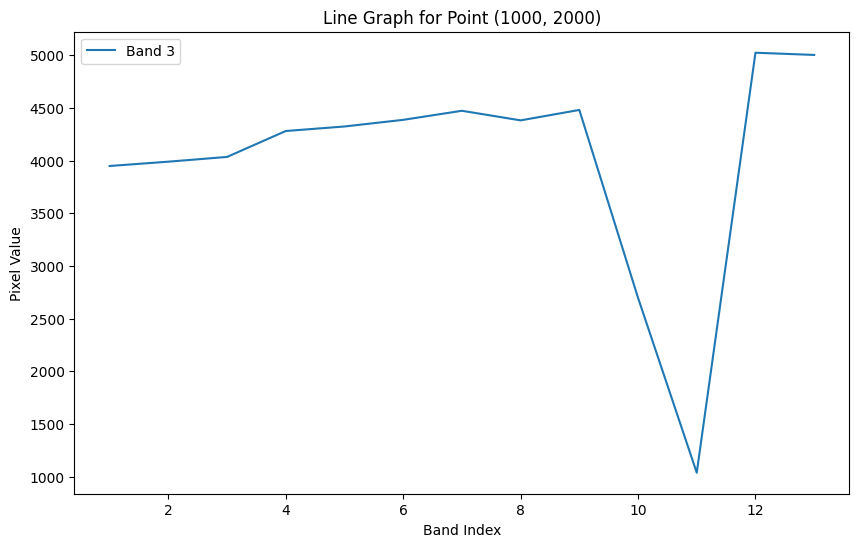

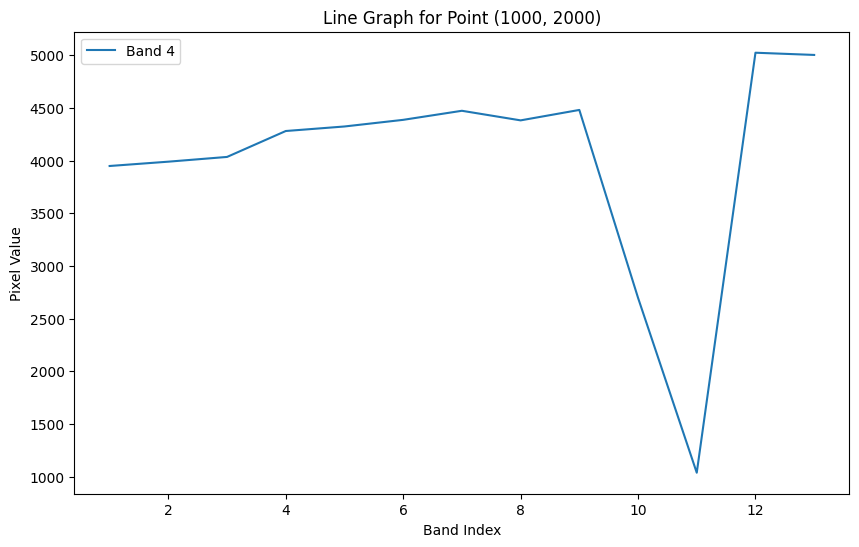

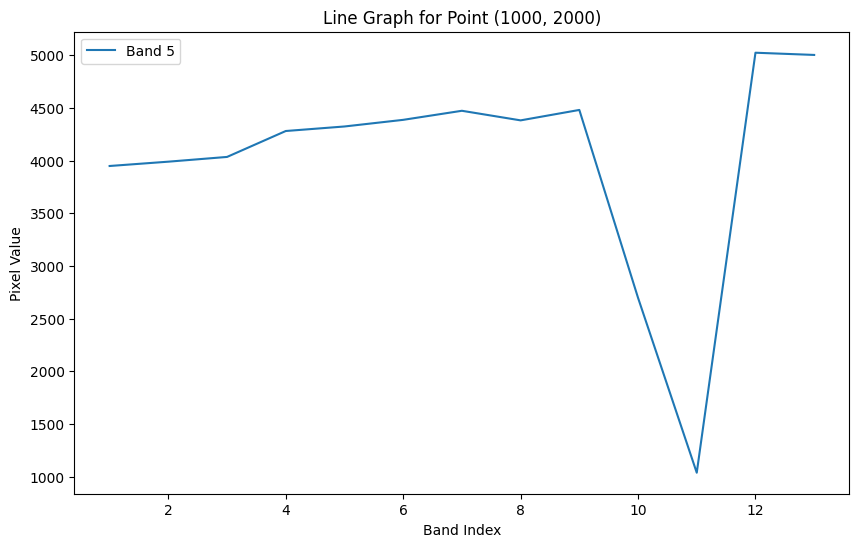

...

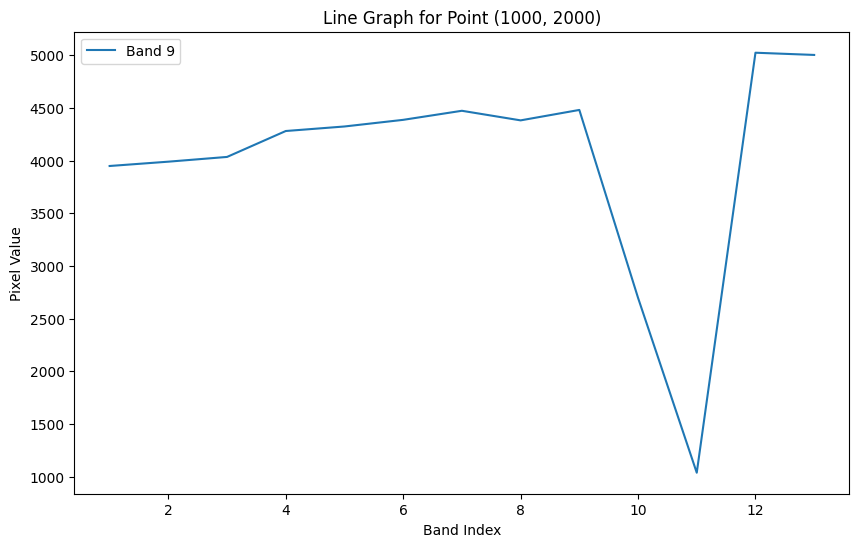

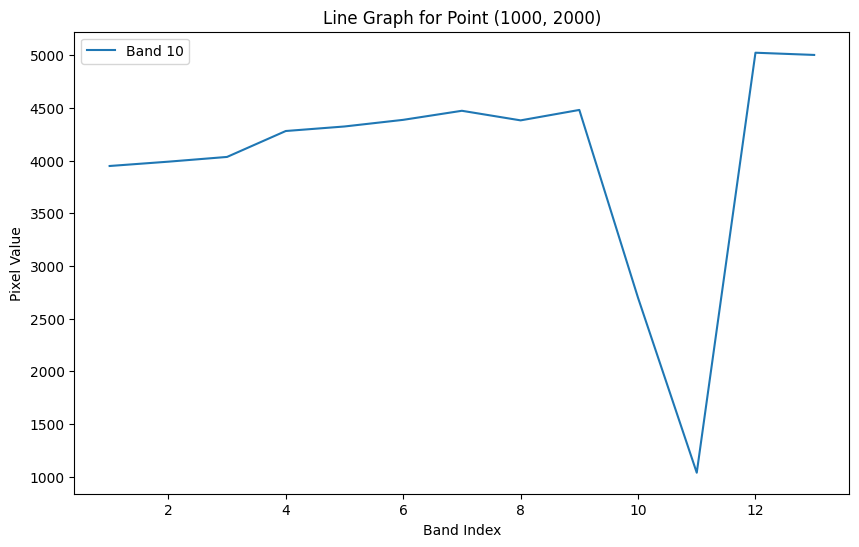

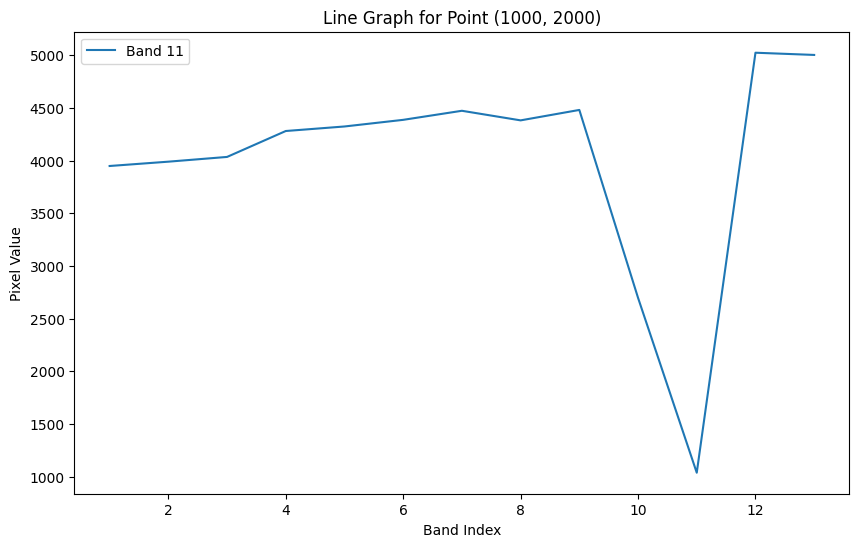

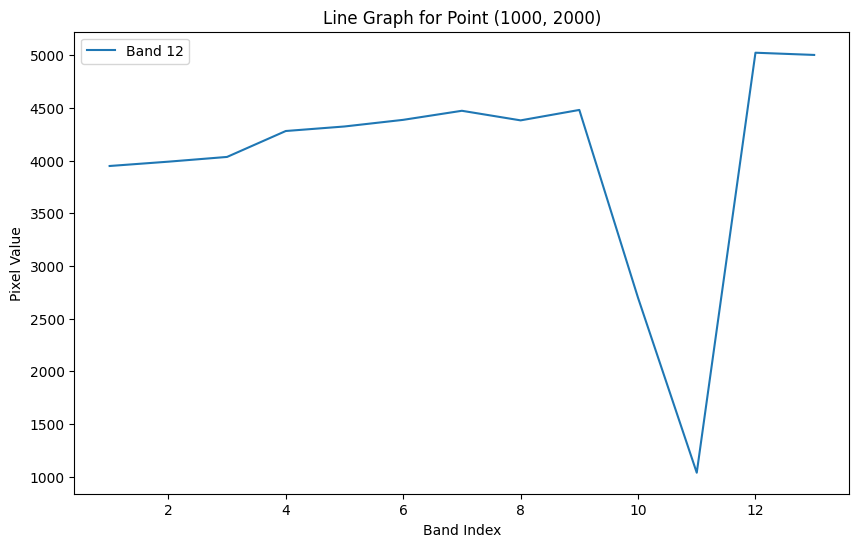

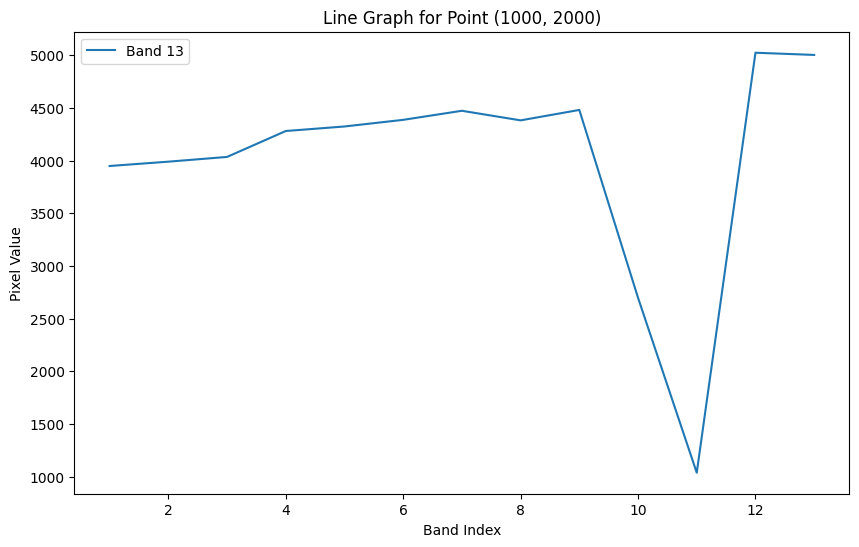

In [ ]:
# Define the path to your Sentinel-2 image
image_path = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Open the image file using rasterio
with rasterio.open(image_path) as src:
    # Read the image data
    image_data = src.read()

# Function to plot line graph for a specific band and point
def plot_line_graph(band_index, point):
    plt.figure(figsize=(10, 6))

    # Get pixel values for each band at the specified point
    pixel_values = image_data[:, point[0], point[1]]

    # Ensure that the point coordinates are within the valid range
    if point[0] < image_data.shape[1] and point[1] < image_data.shape[2]:
        # Check if pixel_values is 1-dimensional or 2-dimensional
        if len(pixel_values.shape) == 1:
            x_values = np.arange(1, len(pixel_values) + 1)
            y_values = pixel_values
        else:
            x_values = np.arange(1, pixel_values.shape[1] + 1)
            y_values = pixel_values[band_index, :]

        # Plot the line graph for the specified band and point
        plt.plot(x_values, y_values, label=f'Band {band_index + 1}')
        plt.title(f'Line Graph for Point {point}')
        plt.xlabel('Band Index')
        plt.ylabel('Pixel Value')
        plt.legend()
        plt.show()
    else:
        print(f"Error: The specified point {point} is out of image range.")

# Specify the point for the line chart (you can change this)
point_to_display = (1000, 2000)

# Plot the line graph for the specified point for each band
for band_to_display in range(image_data.shape[0]):
    plot_line_graph(band_to_display, point_to_display)


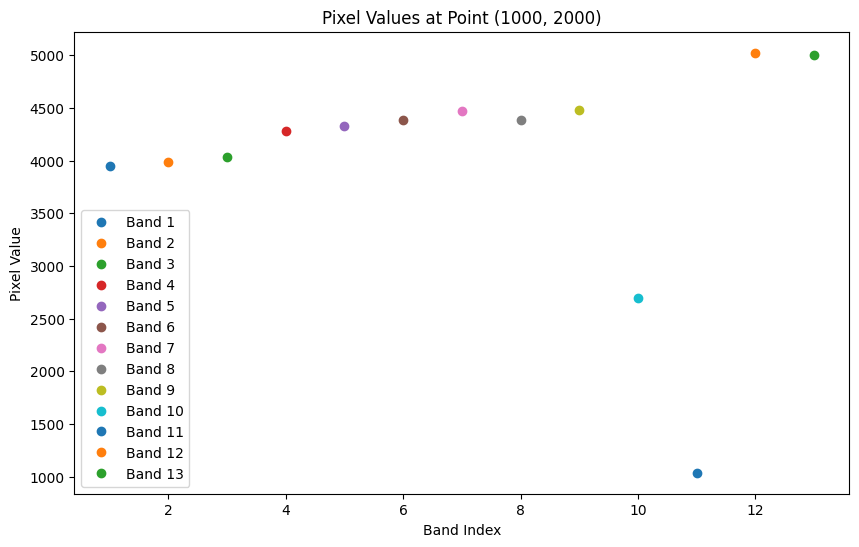

(1000, 2000)


In [ ]:
# Define the path to your Sentinel-2 image
image_path = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Open the image file using rasterio
with rasterio.open(image_path) as src:
    # Read the image data
    image_data = src.read()

# Function to plot line graph for a specific point
def plot_line_graph(point):
    plt.figure(figsize=(10, 6))

    # Iterate through bands
    for band_index in range(image_data.shape[0]):
        # Get the pixel value at the specified point
        pixel_value = image_data[band_index, point[0], point[1]]

        # Plot the pixel value for each band
        plt.plot(band_index + 1, pixel_value, 'o', label=f'Band {band_index + 1}')

    # Set labels and legend
    plt.title(f'Pixel Values at Point {point}')
    plt.xlabel('Band Index')
    plt.ylabel('Pixel Value')
    plt.legend()
    plt.show()

# Specify the point for the line chart (you can change this)
point_to_display = (1000, 2000)

# Plot the line graph for the specified point
plot_line_graph(point_to_display)
print(point_to_display)


In [ ]:
# Define the path to your Sentinel-2 image
image_path = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Open the image file using rasterio
with rasterio.open(image_path) as src:
    # Read the image data
    image_data = src.read()

# Specify the point for which you want to extract pixel values
point_to_display = (1000, 2000)

# Initialize a list to store pixel values for each band
pixel_values_by_band = []

# Iterate through bands
for band_index in range(image_data.shape[0]):
    # Get the pixel value at the specified point for the current band
    pixel_value = image_data[band_index, point_to_display[0], point_to_display[1]]
    pixel_values_by_band.append(pixel_value)

# Print the pixel values for each band at the specified point
for band_index, pixel_value in enumerate(pixel_values_by_band):
    print(f"Band {band_index + 1} - Pixel Value: {pixel_value}")


Band 1 - Pixel Value: 3948
Band 2 - Pixel Value: 3989
Band 3 - Pixel Value: 4034
Band 4 - Pixel Value: 4280
Band 5 - Pixel Value: 4323
Band 6 - Pixel Value: 4386
Band 7 - Pixel Value: 4472
Band 8 - Pixel Value: 4381
Band 9 - Pixel Value: 4480
Band 10 - Pixel Value: 2697
Band 11 - Pixel Value: 1037
Band 12 - Pixel Value: 5023
Band 13 - Pixel Value: 5002


[[6710 6474 6380 ... 1867 6578 6020]
 [5330 5279 5023 ... 1140 1741 1601]
 [3151 3047 3106 ... 1038 4239 4022]
 ...
 [2914 2807 2434 ... 1030 1160 1123]
 [6797 6818 6565 ... 1635 3703 3376]
 [3252 3573 3741 ... 1037 4576 4380]]


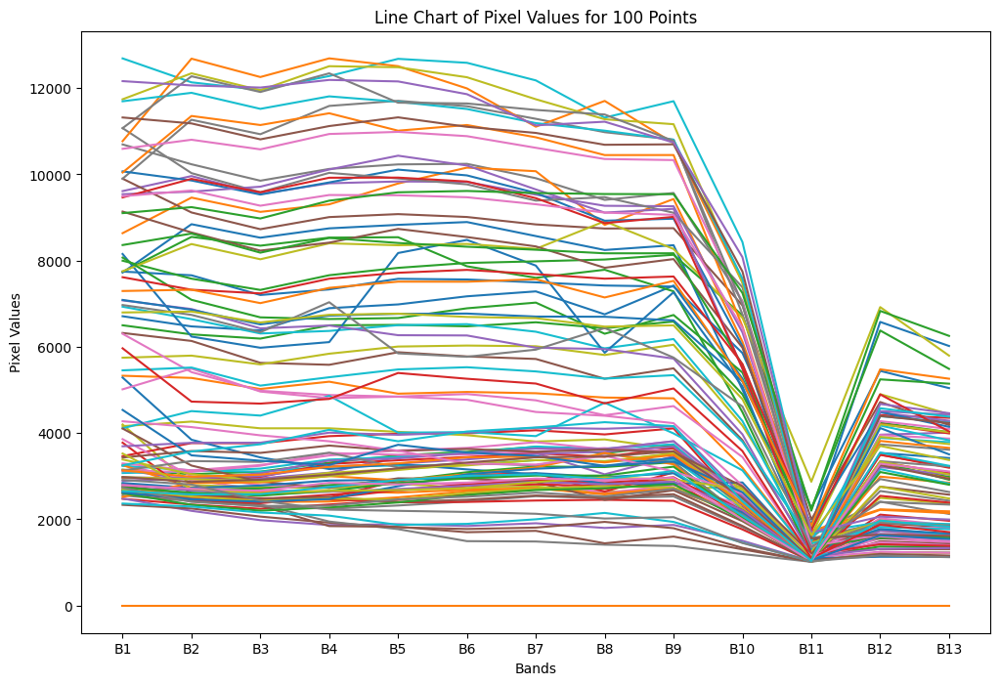

In [ ]:
# Define the path to your Sentinel-2 image
image_path = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Open the image file using rasterio
with rasterio.open(image_path) as src:
    # Read the image data
    image_data = src.read()

# Generate 100 random points for demonstration
np.random.seed(42)  # For reproducibility
points_to_display = np.random.randint(0, min(image_data.shape[1], image_data.shape[2]), size=(100, 2))

# Initialize a list to store pixel values for each point and each band
pixel_values_by_point = []

# Iterate through points
for point in points_to_display:
    pixel_values_by_band = []

    # Iterate through bands
    for band_index in range(image_data.shape[0]):
        # Get the pixel value at the current point for the current band
        pixel_value = image_data[band_index, point[0], point[1]]
        pixel_values_by_band.append(pixel_value)

    pixel_values_by_point.append(pixel_values_by_band)

# Convert the list to a NumPy array for easy indexing
pixel_values_by_point = np.array(pixel_values_by_point)
print (pixel_values_by_point)
# Plot the line chart
plt.figure(figsize=(12, 8))

for i in range(pixel_values_by_point.shape[0]):
    plt.plot(range(1, image_data.shape[0] + 1), pixel_values_by_point[i, :], label=f'P{i + 1}')

plt.xticks(range(1, image_data.shape[0] + 1), [f'B{i}' for i in range(1, image_data.shape[0] + 1)])
plt.title('Line Chart of Pixel Values for 100 Points')
plt.xlabel('Bands')
plt.ylabel('Pixel Values')
#plt.legend(loc='upper right')
plt.show()


Total number of pixels in one band: 10933473


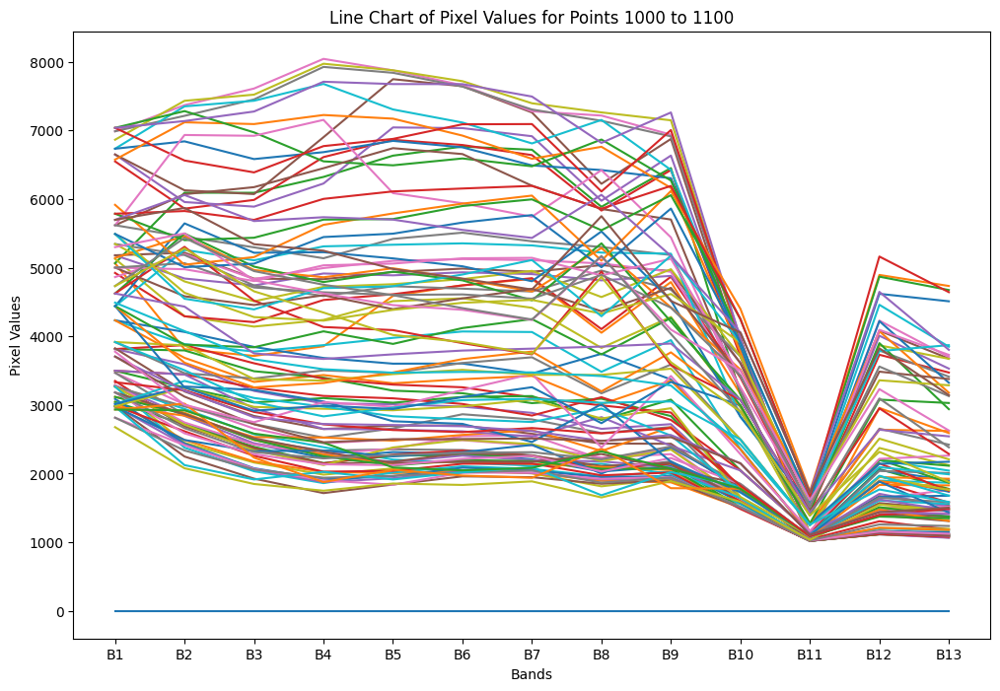

In [12]:
# Define the path to your Sentinel-2 image
image_path = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Open the image file using rasterio
with rasterio.open(image_path) as src:
    # Read the image data
    image_data = src.read()

# Print the total number of pixels in one band (assuming the first band, change the index if needed)
total_pixels_in_band = image_data[0].size
print(f'Total number of pixels in one band: {total_pixels_in_band}')

# Generate points from 1000 to 1100 for demonstration
points_to_display = np.arange(1, 201).reshape(-1, 2)

# Initialize a list to store pixel values for each point and each band
pixel_values_by_point = []

# Iterate through points
for point in points_to_display:
    pixel_values_by_band = []

    # Iterate through bands
    for band_index in range(image_data.shape[0]):
        # Get the pixel value at the current point for the current band
        pixel_value = image_data[band_index, point[0], point[1]]
        pixel_values_by_band.append(pixel_value)

    pixel_values_by_point.append(pixel_values_by_band)

# Convert the list to a NumPy array for easy indexing
pixel_values_by_point = np.array(pixel_values_by_point)

# Plot the line chart
plt.figure(figsize=(12, 8))

for i in range(pixel_values_by_point.shape[0]):
    plt.plot(range(1, image_data.shape[0] + 1), pixel_values_by_point[i, :], label=f'P{i + 1}')

plt.xticks(range(1, image_data.shape[0] + 1), [f'B{i}' for i in range(1, image_data.shape[0] + 1)])
plt.title('Line Chart of Pixel Values for Points 1000 to 1100')
plt.xlabel('Bands')
plt.ylabel('Pixel Values')
plt.show()


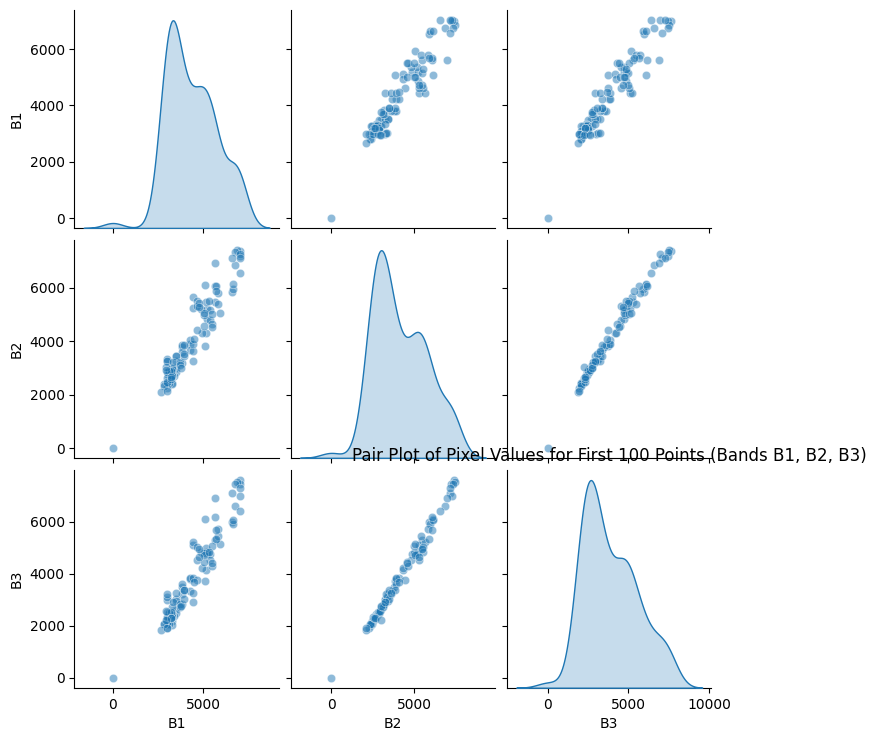

In [ ]:
import seaborn as sns
import pandas as pd

# Convert the pixel values to a DataFrame for Seaborn
df = pd.DataFrame(pixel_values_by_point[:, :3], columns=['B1', 'B2', 'B3'])

# Create a pair plot without the legend and individual points
sns.pairplot(df, markers='o', diag_kind='kde', plot_kws={'alpha': 0.5})
plt.title('Pair Plot of Pixel Values for First 100 Points (Bands B1, B2, B3)')
plt.show()


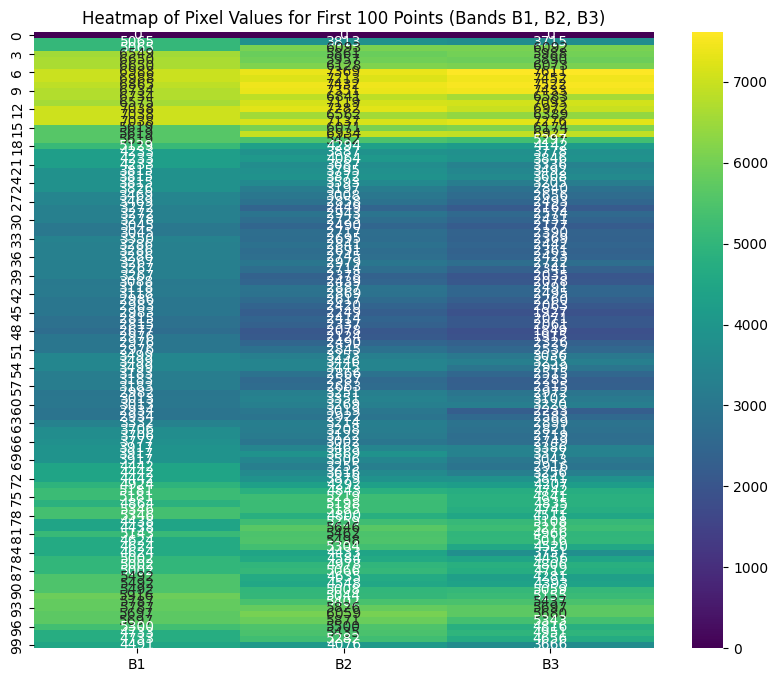

In [ ]:
# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(df.iloc[:, :3], cmap='viridis', annot=True, fmt='g')
plt.title('Heatmap of Pixel Values for First 100 Points (Bands B1, B2, B3)')
plt.show()


In [ ]:
# Normalize the image data

normalized_image_data = image_data / image_data.max()

Image Shape: (13, 2797, 3909)
Number of Bands: 13
Resolution: (8.983152841195215e-05, 8.983152841195215e-05)
Coordinate Reference System (CRS): EPSG:4326


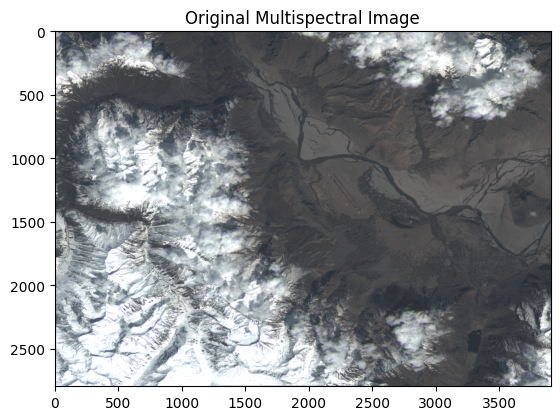

In [ ]:
import rasterio
import matplotlib.pyplot as plt

# Define the path to your Sentinel-2 image
image_path = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Open the multispectral image
src = rasterio.open(image_path)

# Read the multispectral bands
bands = src.read()

# Display metadata information
print(f"Image Shape: {bands.shape}")
print(f"Number of Bands: {src.count}")
print(f"Resolution: {src.res}")
print(f"Coordinate Reference System (CRS): {src.crs}")

# Choose specific bands for RGB visualization
rgb_bands = bands[[2, 1, 0], :, :]  # Assuming bands 3, 2, 1 for RGB visualization

# Normalize the data for displaying RGB image
rgb_image = (rgb_bands.clip(0, 10000) / 10000).transpose(1, 2, 0)

# Display the original multispectral image
plt.imshow(rgb_image)
plt.title('Original Multispectral Image')
plt.show()


In [ ]:
from sklearn.cluster import KMeans

# Reshape the image to a 2D array of pixels
pixels = rgb_image.reshape((-1, 3))

# Apply K-Means clustering
kmeans = KMeans(n_clusters=4)  # Adjust the number of clusters based on your classes
kmeans.fit(pixels)

# Assign labels to each pixel
segmented_image = kmeans.labels_.reshape(rgb_image.shape[:2])


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
# Example: Crop the image to the region of interest (ROI)
roi = rgb_image[100:500, 200:600, :]

# Example: Divide the cropped image into patches (adjust the patch size as needed)
patch_size = 50
patches = [roi[i:i+patch_size, j:j+patch_size, :] for i in range(0, roi.shape[0], patch_size)
                                                      for j in range(0, roi.shape[1], patch_size)]


In [ ]:
# Perform label processing based on your requirements
# This could include filtering, thresholding, or other techniques
# Example: Convert labels to binary mask (assuming you want to create a binary mask)
binary_mask = (segmented_image == 1)  # Adjust the label value as needed


In [ ]:
# Generate a color code (hexadecimal)
color_code = '#3C1098'


In [ ]:
# Convert a hexadecimal color code to RGB
def hex_to_rgb(hex_color):
    hex_color = hex_color.lstrip('#')
    rgb = tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))
    return rgb

# Example usage:
rgb_color = hex_to_rgb(color_code)
print("RGB Color:", rgb_color)


RGB Color: (60, 16, 152)


In [ ]:
from sklearn.preprocessing import OneHotEncoder

# Reshape the labels for one-hot encoding
labels_reshaped = segmented_image.reshape(-1, 1)

# Apply one-hot encoding
encoder = OneHotEncoder(sparse=False)
one_hot_labels = encoder.fit_transform(labels_reshaped)


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Spectral Analysis using Rasterio:

In [2]:
!pip install rasterio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 33.8 MB/s eta 0:00:00


In [3]:
%time
import rasterio
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans


# Define the path to your Sentinel-2 image
image_path = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'

# Open the multispectral image
src = rasterio.open(image_path)

# Read the multispectral bands
bands = src.read()

# Choose specific bands for RGB visualization
rgb_bands = bands[[2, 1, 0], :, :]  # Assuming bands 3, 2, 1 for RGB visualization

# Normalize the data for displaying RGB image
rgb_image = (rgb_bands.clip(0, 10000) / 10000).transpose(1, 2, 0)

# Reshape the image to a 2D array of pixels
pixels = rgb_image.reshape((-1, 3))

# Apply K-Means clustering
kmeans = KMeans(n_clusters=4)  # Adjust the number of clusters based on your classes
kmeans.fit(pixels)

# Assign labels to each pixel
spectral_labels = kmeans.labels_.reshape(rgb_image.shape[:2])


CPU times: user 4 µs, sys: 1 µs, total: 5 µs
Wall time: 8.34 µs


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Spatial Analysis using Scikit-Learn:

In [4]:
%time
from sklearn.preprocessing import OneHotEncoder
import numpy as np

# Example: Create a binary spatial mask (adjust as needed)
spatial_mask = np.random.choice([0, 1], size=(rgb_image.shape[0], rgb_image.shape[1]))

# Reshape the spatial mask for one-hot encoding
spatial_labels_reshaped = spatial_mask.reshape(-1, 1)

# Apply one-hot encoding
encoder = OneHotEncoder(sparse=False)
spatial_one_hot_labels = encoder.fit_transform(spatial_labels_reshaped)

# Reshape the spatial one-hot labels to match the shape of spectral labels
spatial_one_hot_labels = spatial_one_hot_labels.reshape(rgb_image.shape[:2] + (-1,))


CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 8.34 µs


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


CPU times: user 4 µs, sys: 1e+03 ns, total: 5 µs
Wall time: 8.11 µs


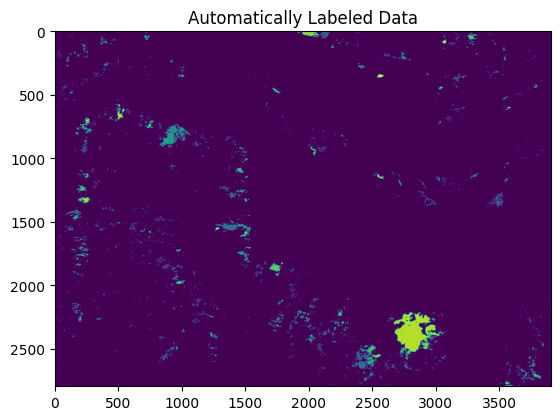

In [5]:
%time
from scipy.ndimage import label
from scipy.ndimage import generate_binary_structure

# Combine the spatial and spectral labels
combined_labels = np.concatenate([spatial_one_hot_labels, spectral_labels.reshape(rgb_image.shape[:2] + (1,))], axis=2)

# Define class labels
class_labels = {
    'Snow': 0,
    'Water': 1,
    'Cloud': 2,
    'Rocks': 3,
    'Debris': 4
}

# Perform majority voting to get the final labels
structure = generate_binary_structure(2, 2)  # Define a 3x3 neighborhood structure
labeled_data, _ = label(combined_labels[:, :, -1], structure=structure)

# Map the majority voted labels to the class labels
mapped_labels = np.zeros_like(labeled_data, dtype=np.uint8)
for i in range(1, labeled_data.max() + 1):
    class_count = np.sum(labeled_data == i, axis=0)
    majority_class = np.argmax(class_count)
    mapped_labels[labeled_data == i] = majority_class

# Visualize the labeled data
plt.imshow(mapped_labels, cmap='viridis')  # Adjust the colormap as needed
plt.title('Automatically Labeled Data')
plt.show()


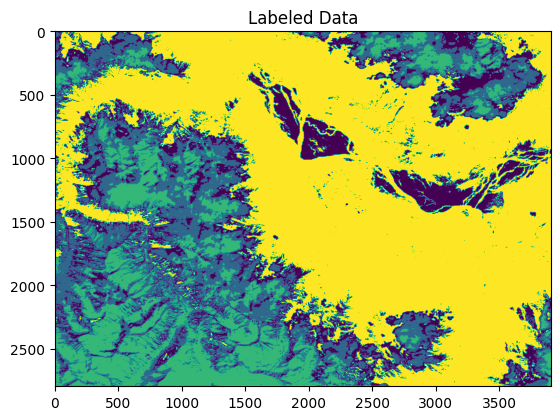

In [6]:
# Define class labels
class_labels = {
    'Snow': 0,
    'Water': 1,
    'Cloud': 2,
    'Rocks': 3,
    'Debris': 4
}

# Example: Assign class labels based on the combined labels
labeled_data = np.zeros_like(combined_labels[:, :, 0], dtype=np.uint8)

# Assign class labels based on the combined labels
for class_name, class_label in class_labels.items():
    class_mask = combined_labels[:, :, -1] == class_label
    labeled_data[class_mask] = class_label

# Visualize the labeled data
plt.imshow(labeled_data, cmap='viridis')  # Adjust the colormap as needed
plt.title('Labeled Data')
plt.show()


# Implementing Second Strategy

In [7]:
!pip install tensorflow rasterio opencv-python


In [8]:
!pip install livelossplot --upgrade


In [10]:
# Load the 13-band image
image_path = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'
with rasterio.open(image_path) as src:
    # Read the image data
    image_data = src.read()


In [11]:
print("image_data shape:", image_data.shape)
print("y shape:", y.shape)


image_data shape: (13, 2797, 3909)


NameError: ignored

In [14]:
# Perform majority voting to get the final labels
structure = generate_binary_structure(2, 2)
labeled_data, _ = label(mapped_labels, structure=structure)

# Map the majority voted labels to the class labels
y = np.zeros_like(labeled_data, dtype=np.uint8)
for class_name, class_label in class_labels.items():
    class_mask = labeled_data == class_label
    y[class_mask] = class_label


In [15]:
# Reshape image_data to have the sample dimension as the first axis
image_data_reshaped = image_data.transpose(1, 2, 0)

# Now, image_data_reshaped should have a shape of (2797, 3909, 13)


In [16]:
# Import necessary libraries
import rasterio
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.backend import set_image_data_format
from tensorflow.keras.layers import Conv2D, MaxPool2D, BatchNormalization
from tensorflow.keras.layers import Activation, Dropout, Flatten, Dense
from tensorflow.keras import optimizers, losses, utils
from tensorflow.keras.utils import to_categorical
from scipy.ndimage import label, generate_binary_structure

# Load the 13-band image
image_path = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'
with rasterio.open(image_path) as src:
    # Read the image data
    image_data = src.read()

# Define class labels
class_labels = {
    'Snow': 0,
    'Water': 1,
    'Cloud': 2,
    'Rocks': 3,
    'Debris': 4
}

# Perform majority voting to get the final labels
structure = generate_binary_structure(2, 2)  # Define a 3x3 neighborhood structure
labeled_data, _ = label(mapped_labels, structure=structure)

# Map the majority voted labels to the class labels
y = np.zeros_like(labeled_data, dtype=np.uint8)
for class_name, class_label in class_labels.items():
    class_mask = labeled_data == class_label
    y[class_mask] = class_label

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(image_data_reshaped, y, test_size=0.2, random_state=42)

# Normalize the pixel values to the range [0, 1]
X_train = X_train / 10000.0
X_val = X_val / 10000.0

# Convert labels to one-hot encoding
y_train_one_hot = to_categorical(y_train)
y_val_one_hot = to_categorical(y_val)

# Reshape the training data to add a channel dimension
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2], 1)
X_val = X_val.reshape(X_val.shape[0], X_val.shape[1], X_val.shape[2], 1)

# Define the CNN model
set_image_data_format('channels_last')  # Change to 'channels_last' if using TensorFlow 2.x
model = Sequential()
model.add(Conv2D(28, (3, 3), padding='same', input_shape=(X_train.shape[1], X_train.shape[2], 1)))
model.add(Activation('relu'))
model.add(Conv2D(28, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(MaxPool2D(2, 2))
model.add(Conv2D(56, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(Conv2D(56, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(MaxPool2D(2, 2))
model.add(Conv2D(112, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(Conv2D(112, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(MaxPool2D(2, 2))
model.add(Flatten())
model.add(Dense(784))
model.add(Activation('relu'))
model.add(Dropout(0.6))
model.add(Dense(len(np.unique(y))))
model.add(Activation('sigmoid'))  # Use softmax if multi-class classification


# Measure the time taken for training
%time
adam = optimizers.Adam(lr=0.001)
model.compile(optimizer=adam, loss=losses.binary_crossentropy, metrics=['accuracy'])

# Visualize training history if needed
# (You may use other visualization tools as livelossplot is not used here)


CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.91 µs


In [ ]:
# Import necessary libraries
import rasterio
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.backend import set_image_data_format
from tensorflow.keras.layers import Conv2D, MaxPool2D, BatchNormalization
from tensorflow.keras.layers import Activation, Dropout, Flatten, Dense
from tensorflow.keras import optimizers, losses, utils
from tensorflow.keras.utils import to_categorical
from scipy.ndimage import label, generate_binary_structure

# Load the 13-band image
image_path = '/content/drive/MyDrive/SentinalTwoImage/Sentinel2.tif'
with rasterio.open(image_path) as src:
    # Read the image data
    image_data = src.read()

# Define class labels
class_labels = {
    'Snow': 0,
    'Water': 1,
    'Cloud': 2,
    'Rocks': 3,
    'Debris': 4
}

# Perform majority voting to get the final labels
structure = generate_binary_structure(3, 1)  # Corrected to have three dimensions
labeled_data, _ = label(image_data, structure=structure)

# Map the majority voted labels to the class labels
y = np.zeros_like(labeled_data, dtype=np.uint8)
for class_name, class_label in class_labels.items():
    class_mask = labeled_data == class_label
    y[class_mask] = class_label

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(image_data, y, test_size=0.2, random_state=42)

# Normalize the pixel values to the range [0, 1]
X_train = X_train / 10000.0
X_val = X_val / 10000.0

# Convert labels to one-hot encoding
y_train_one_hot = to_categorical(y_train)
y_val_one_hot = to_categorical(y_val)

# Reshape the training data to add a channel dimension
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2], 1)
X_val = X_val.reshape(X_val.shape[0], X_val.shape[1], X_val.shape[2], 1)

# Continue with the rest of your code...

# Define the CNN model
set_image_data_format('channels_last')  # Change to 'channels_last' if using TensorFlow 2.x
model = Sequential()
model.add(Conv2D(28, (3, 3), padding='same', input_shape=(X_train.shape[1], X_train.shape[2], 1)))
model.add(Activation('relu'))
model.add(Conv2D(28, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(MaxPool2D(2, 2))
model.add(Conv2D(56, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(Conv2D(56, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(MaxPool2D(2, 2))
model.add(Conv2D(112, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(Conv2D(112, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(MaxPool2D(2, 2))
model.add(Flatten())
model.add(Dense(784))
model.add(Activation('relu'))
model.add(Dropout(0.6))
model.add(Dense(len(np.unique(y))))
model.add(Activation('sigmoid'))  # Use softmax if multi-class classification

# Measure the time taken for training
%time

adam = optimizers.Adam(lr=0.001)
model.compile(optimizer=adam, loss=losses.binary_crossentropy, metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train_one_hot, validation_data=(X_val, y_val_one_hot), epochs=20, batch_size=50)

# Visualize training history
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()
